In [1]:
# importing necessary libraries and configurations
import pandas as pd
import matplotlib.pyplot as plt
from fbprophet import Prophet
from fbprophet.plot import plot_plotly
from fbprophet.plot import add_changepoints_to_plot

plt.style.use("fivethirtyeight") 
%matplotlib inline

In [2]:
# loading the dataset
df = pd.read_csv("df_clean.csv")

In [3]:
# data cleaning and indexing 
df.occurred_date_time = df.occurred_date_time.astype("datetime64")
df.set_index(["occurred_date_time"], inplace=True)
df.sort_index(inplace=True)

# examining the new dataframe
display(df.head())
display(df.tail())

,highest_offense_description,family_violence,report_date_time,location_type,address,zip_code,council_district,apd_sector,apd_district,clearance_status,clearance_date,latitude,longitude,year,month,week,day,hour
occurred_date_time,,,,,,,,,,,,,,,,,,
2003-01-01,IDENTITY THEFT,N,2009-07-22 11:09:00,RESIDENCE / HOME,1941 GASTON PLACE DR,78723.0,1.0,ID,4,N,2009-07-28 00:00:00,30.312126,-97.688964,2003,1,1,1,0
2003-01-01,OBTAIN CONTROLLED SUB BY FRAUD,N,2003-11-14 09:30:00,NaN,6818 AUSTIN CENTER BLVD,78731.0,10.0,BA,8,N,2003-12-01 00:00:00,30.350588,-97.751779,2003,1,1,1,0
2003-01-01,IDENTITY THEFT,N,2011-02-08 15:14:00,RESIDENCE / HOME,8220 W SH 71,78735.0,8.0,DA,6,N,2011-05-23 00:00:00,30.246747,-97.887325,2003,1,1,1,0
2003-01-01,INDECENCY WITH A CHILD/CONTACT,Y,2017-10-02 21:14:00,RESIDENCE / HOME,1200 BLOCK AUSTIN HIGHLANDS BLVD,78745.0,2.0,FR,4,N,2018-08-02 00:00:00,NaN,NaN,2003,1,1,1,0
2003-01-01,IDENTITY THEFT,N,2013-03-11 17:28:00,RESIDENCE / HOME,7001 S CONGRESS AVE,78745.0,2.0,FR,3,N,2013-03-12 00:00:00,30.188878,-97.780075,2003,1,1,1,0


,highest_offense_description,family_violence,report_date_time,location_type,address,zip_code,council_district,apd_sector,apd_district,clearance_status,clearance_date,latitude,longitude,year,month,week,day,hour
occurred_date_time,,,,,,,,,,,,,,,,,,
2020-12-12 18:04:00,THEFT,N,2020-12-12 18:04:00,OTHER / UNKNOWN,6800 BURNET RD,78757.0,7.0,BA,6,NaN,NaN,30.344223,-97.738650,2020,12,50,12,18
2020-12-12 18:44:00,DISRUPTING MEETING/PROCESSION,N,2020-12-12 18:44:00,STREETS / HWY / ROAD / ALLEY,1600 S PLEASANT VALLEY RD,78741.0,3.0,HE,2,NaN,NaN,30.238012,-97.720613,2020,12,50,12,18
2020-12-12 18:45:00,THEFT FROM PERSON,N,2020-12-12 20:56:00,DEPARTMENT / DISCOUNT STORE,5445 N IH 35 SVRD NB,78723.0,4.0,ID,5,NaN,NaN,30.314695,-97.707461,2020,12,50,12,18
2020-12-12 19:48:00,THEFT FROM BUILDING,N,2020-12-12 19:48:00,RESIDENCE / HOME,13201 LEGENDARY DR,78727.0,6.0,AD,3,NaN,NaN,30.436800,-97.730387,2020,12,50,12,19
2020-12-12 21:59:00,NUISANCE ABATEMENT,N,2020-12-12 21:59:00,BAR / NIGHT CLUB,607 TRINITY ST,78701.0,9.0,GE,2,NaN,NaN,30.267623,-97.738899,2020,12,50,12,21


In [4]:
# Creating violent crime and murder dataframes for analysis
df_viol = df.query(
    'highest_offense_description == ["AGG ASSAULT", "AGG ROBBERY/DEADLY WEAPON", "CAPITAL MURDER", "MURDER", "RAPE"]'
)

df_viol_mur = df.query('highest_offense_description == ["MURDER", "CAPITAL MURDER"]')

## Predicting crime rates with Facebook Prophet 

INFO:fbprophet:Found custom seasonality named 'weekly', disabling built-in 'weekly' seasonality.
INFO:fbprophet:Found custom seasonality named 'daily', disabling built-in 'daily' seasonality.


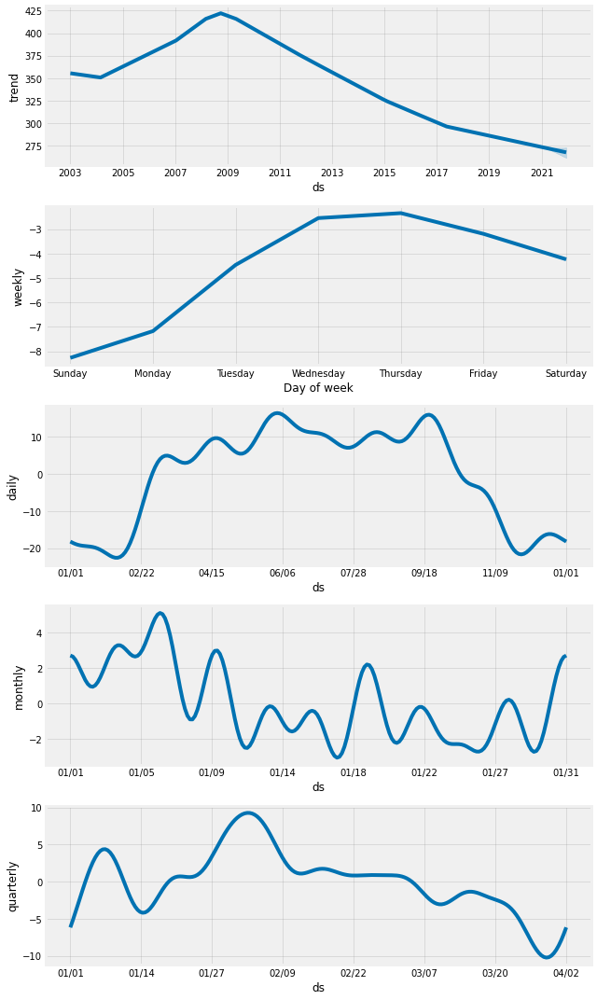

In [5]:
# forecasting for overall crime 
df_fbprophet = df

df_m = df_fbprophet.resample("D").size().reset_index()
df_m.columns = ["date", "daily_crime_count"]
df_m_final = df_m.rename(columns={"date": "ds", "daily_crime_count": "y"})

m = Prophet(interval_width=0.95, yearly_seasonality=False)
m.add_seasonality(name="monthly", period=30.5, fourier_order=10)
m.add_seasonality(name="quarterly", period=91.5, fourier_order=10)
m.add_seasonality(name="weekly", period=52, fourier_order=10)
m.add_seasonality(name="daily", period=365, fourier_order=10)
m.fit(df_m_final)

future = m.make_future_dataframe(periods=365, freq="D")
pred = m.predict(future)

fig2 = m.plot_components(pred)
fig2_1 = plot_plotly(m, pred)
fig2_1

INFO:fbprophet:Found custom seasonality named 'weekly', disabling built-in 'weekly' seasonality.
INFO:fbprophet:Found custom seasonality named 'daily', disabling built-in 'daily' seasonality.


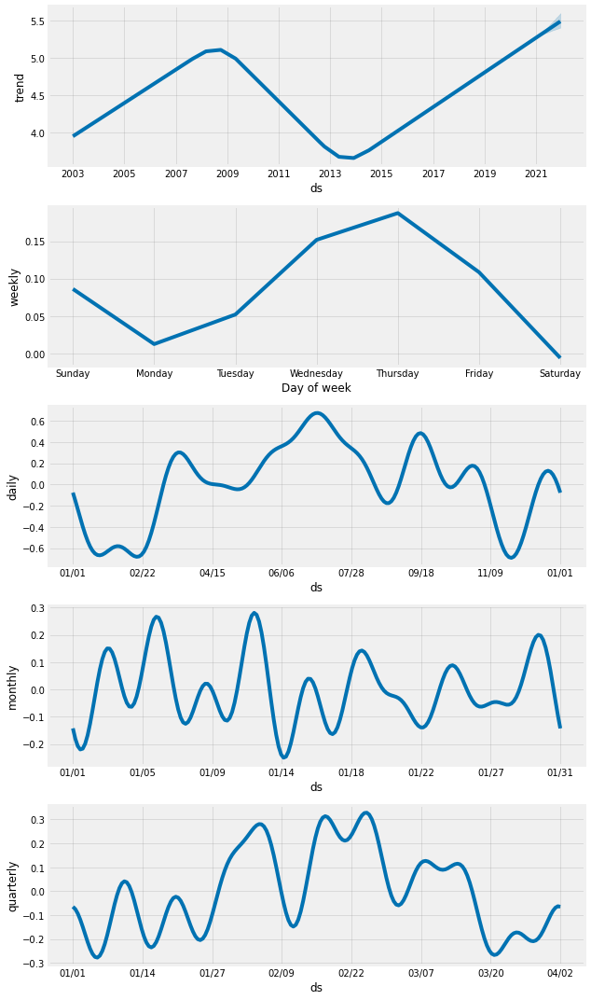

In [6]:
# forecasting for violent crime 
df_viol_fbprophet = df_viol

df_viol_n = df_viol_fbprophet.resample("D").size().reset_index()
df_viol_n.columns = ["date", "daily_crime_count"]
df_viol_n_final = df_viol_n.rename(columns={"date": "ds", "daily_crime_count": "y"})

n = Prophet(interval_width=0.95, yearly_seasonality=False)
n.add_seasonality(name="monthly", period=30.5, fourier_order=10)
n.add_seasonality(name="quarterly", period=91.5, fourier_order=10)
n.add_seasonality(name="weekly", period=52, fourier_order=10)
n.add_seasonality(name="daily", period=365, fourier_order=10)
n.fit(df_viol_n_final)

future = n.make_future_dataframe(periods=365, freq="D")
pred = n.predict(future)

fig3 = n.plot_components(pred)
fig3_1 = plot_plotly(n, pred)
fig3_1

INFO:fbprophet:Found custom seasonality named 'weekly', disabling built-in 'weekly' seasonality.
INFO:fbprophet:Found custom seasonality named 'daily', disabling built-in 'daily' seasonality.


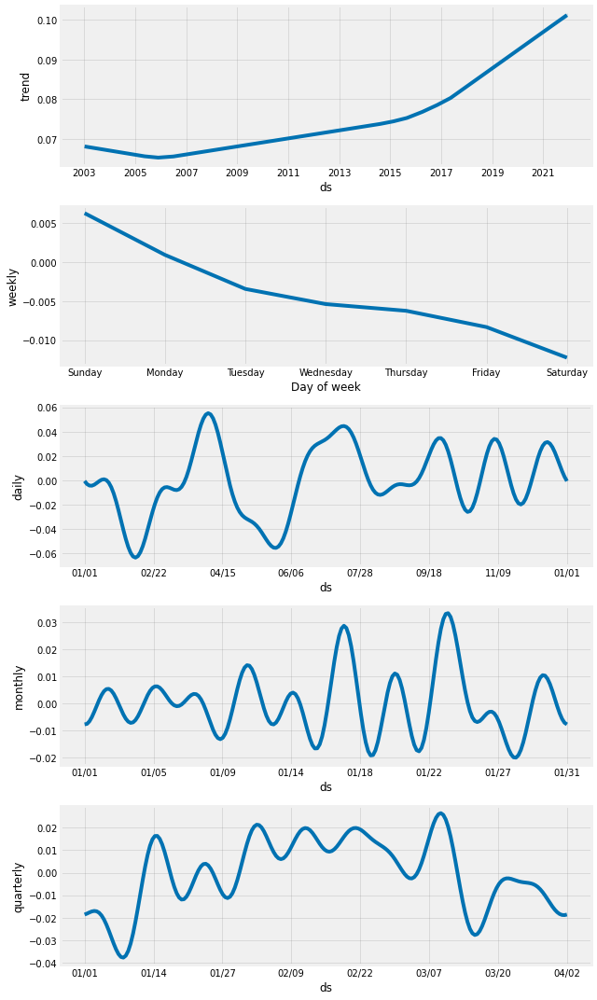

In [7]:
# forecasting for murder rates 
df_viol_mur_fbprophet = df_viol_mur

df_viol_mur_o = df_viol_mur_fbprophet.resample("D").size().reset_index()
df_viol_mur_o.columns = ["date", "daily_crime_count"]
df_viol_mur_o_final = df_viol_mur_o.rename(columns={"date": "ds", "daily_crime_count": "y"})

o = Prophet(interval_width=0.95, yearly_seasonality=False)
o.add_seasonality(name="monthly", period=30.5, fourier_order=10)
o.add_seasonality(name="quarterly", period=91.5, fourier_order=10)
o.add_seasonality(name="weekly", period=52, fourier_order=10)
o.add_seasonality(name="daily", period=365, fourier_order=10)
o.fit(df_viol_mur_o_final)

future = o.make_future_dataframe(periods=365, freq="D")
pred = o.predict(future)

fig4 = o.plot_components(pred)
fig4_1 = plot_plotly(o, pred)
fig4_1